<a href="https://colab.research.google.com/github/xdu006/CellSAM_XL/blob/main/CellSAM_Pipeline_Western4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Setup

In [ ]:
#Setup

from google.colab import drive
drive.mount('/content/drive')

!pip install -q git+https://github.com/xdu006/cellSAM_test.git

import cellSAM
from cellSAM import segment_cellular_image, get_model
import numpy as np
import torch
from scipy.ndimage import binary_dilation
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import tifffile as tf
import numpy as np
import pandas as pd

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Preparing metadata (setup.py) ... done


/usr/local/lib/python3.10/dist-packages/torchvision/datapoints/__init__.py:12: UserWarning: The torchvision.datapoints and torchvision.transforms.v2 namespaces are still Beta. While we do not expect major breaking changes, some APIs may still change according to user feedback. Please submit any feedback you may have in this issue: https://github.com/pytorch/vision/issues/6753, and you can also check out https://github.com/pytorch/vision/issues/7319 to learn more about the APIs that we suspect might involve future changes. You can silence this warning by calling torchvision.disable_beta_transforms_warning().
  warnings.warn(_BETA_TRANSFORMS_WARNING)


cpu


In [ ]:
# for CPU runtime
import numpy as np
import torch
from scipy.ndimage import binary_dilation
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import tifffile as tf
import numpy as np
import pandas as pd

from google.colab import drive
drive.mount('/content/drive')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

Mounted at /content/drive
cpu


1. test guelph dataset (small piece) ❌ Guelph image set has no clear pictures of cells... maybe we should try something else for these pictures... just regular sam? prompt tuning?

2. once it works, we just need to cut to a ratio of the cell size ✅
  *   Completed the ratio calculations (NOTE: should add input for cell size)
    * Need to test on different images
  *   Preliminary tiling complete
    * Consider edge cases for cells...

3. finally, we should get a count of cells for each channel for the full image. (sum)
  * Done, but each channel done individually, not that efficient...
  * **Need to check the input, should I do each channel *3 individually, or does the results output output each cell individually? **
  * **What kind of input does cellsam really accept? ** --> only 3 channel and output is not divided. Is there a way to do this?

Then, find relative location --> quantification pipeline basically done!

#File Processing

Loading image... Image Loaded: 3 Channel image detected.
Channel shape is (4, 1775, 2058). Performing convertion to (H,W,C) format. 
Channel shape is now (1775, 2058, 4).
Max pixel value: 4095.0


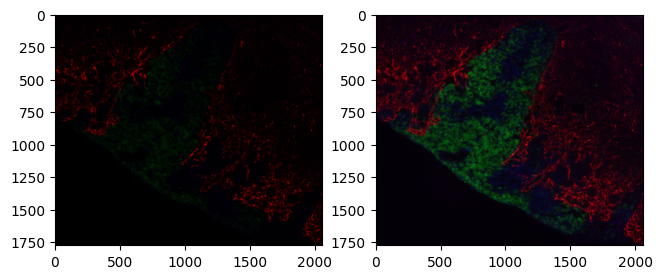

In [ ]:
#load file
#file_name = "/content/drive/MyDrive/Summer/Images/Western4.tif"
#file_name = "/content/drive/MyDrive/Summer/Images/Western1 Patches/Western1-9.tif"
#file_name = "/content/drive/MyDrive/Summer/Images/Western2.tif"
file_name = "/content/drive/MyDrive/Summer/Images/Western4-bottom.tif"
raw_tiff_file = tf.imread(file_name).astype(np.float64)

export_file_path = "/content/drive/MyDrive/Summer/Images/"
#export_file_name = "SUMMARY_4_right"
                                                                                                                              #ADD: manage multiple file types? RGB color channel scaling

#Check input file shape (Channel last)
match raw_tiff_file.ndim:
  case 0: print("Loading image... No data detected, please check tiff file loaded")
  case 1: print("Loading image... Image Loaded: File only had one dimention. Are you sure you loaded a 2D image...?")
  case 2: print("Loading image... Image Loaded: 1 Channel image detected. Is this really what you want...?")
  case 3:
    print("Loading image... Image Loaded: 3 Channel image detected.")
    if raw_tiff_file.shape[0] < raw_tiff_file.shape[1]: #always convert to # H, W, C
      print(f"Channel shape is {raw_tiff_file.shape}. Performing convertion to (H,W,C) format. ")
      raw_tiff_file = np.transpose(raw_tiff_file, (1, 2, 0))
      print(f"Channel shape is now {raw_tiff_file.shape}.")
  case 4: print("Image Loaded: 4 Channel image detected... Currently we do not support 3D images.")
  case _: print("Image Loaded: Unknown image format.")

#Scale image
print(f"Max pixel value: {max(raw_tiff_file.flatten())}")
#for c in range(raw_tiff_file.shape[2]): raw_tiff_file[:,:,c] = raw_tiff_file[:,:,c]/max(raw_tiff_file[:,:,c].flatten()) #scale to based on max
#raw_tiff_file = raw_tiff_file/4200 #scale to 0-1

original_image = np.copy(raw_tiff_file)
channel_scaled = np.copy(raw_tiff_file) #NOTE: Use unscaled for this
for c in range(raw_tiff_file.shape[2]): channel_scaled[:,:,c] = raw_tiff_file[:,:,c]/max(raw_tiff_file[:,:,c].flatten()) #scale to based on max
scaled_gamma15 = np.copy(channel_scaled)
scaled_gamma15 = np.power(channel_scaled, 1/1.5)
raw_tiff_file =  scaled_gamma15                                                                                 #currently hardcoded
                                                                                                                                    ###MIGHT NEED TO SCALE THE pixles to MICRONS STUFF & get cell type rather than cell shape?
cell_size = [696-688.4, 1091.6-1084.4] #y, x, (western1, USER INPUT) #cell_size = (684-679, 633-627) #x, y, guelph1                 #need to add input for this
#cell_size = [685-669, 277-262]

fig = plt.figure(figsize=(20, 20))
fig.add_subplot(5, 5, 1)
plt.imshow(original_image[:,:,(0,1,3)]/4200)
fig.add_subplot(5, 5, 2)
plt.imshow(raw_tiff_file[:,:,(0,1,3)])

# Define Functions

In [ ]:
# Determine crop dimentions and crop into tiles

def get_crop_dimentions(cell_size):
  C2T_RATIO = [0.038, 0.036]  #Target Ratio: KNOWN VALUE based on our testing
  return int(round(np.mean([cell_size[i]/C2T_RATIO[i] for i in range(2)]))) #ratio to crop  (take the mean of the two dimentions as the dimention of the square)

def get_tiles(im, yDim: int=200, xDim: int=200, saveFolder=None, id=None, ijmeta=None):
  tiles = [im[y:y+yDim, x:x+xDim, :] for y in range(0,im.shape[0],yDim) for x in range(0,im.shape[1],xDim)]
  for i in range(len(tiles)): #add padding to tiles outside of region
    if tiles[i].shape[0] != yDim or tiles[i].shape[1] != xDim:
      padding = np.zeros( shape=(yDim,xDim,im.shape[2]), dtype=np.float64)
      padding[0:tiles[i].shape[0], 0:tiles[i].shape[1], :] = tiles[i]
      tiles[i] = padding
  return tiles

#run cellsam on all tiles
def run_cellsam(tiles, channel):
  return ([segment_cellular_image(img[:,:, channel], device=str(device)) for img in tiles])

#sum the count of cells in all tiles                                                                  does this work for 1 tile??
def get_total_count(results):
  sum_cells=0;
  for i in range(len(results)): #for every tile
    print(f"Tile {i+1}: ", end = "")
    if results[i][2] is not None: #if the number of detected objects in "bounding_boxes" is not zero (identity test)
      print(f"{results[i][2].shape[0]} cells")
      sum_cells+=results[i][2].shape[0]
    else: print("0 cells")                                                                                #consider making this into a outputted table (easy graphing)
  return sum_cells

#results... per image, tuple of 3 objects: mask, embedding, bounding_boxes

In [ ]:
#Quantification prototype for ONE TILE
def get_num_cells(bb):
  if bb is None: return 0
  return bb.shape[0]


def get_centroids(bounding_boxes, img_scale_dim, return_scaled_BB=False):
  centroids = []
  if bounding_boxes is None: return centroids                                                                             # NOTE: consider using a set for better searching efficiency?

  bb = bounding_boxes.cpu().detach().numpy()/1024*img_scale_dim   #x1, y1, x2, y2
  for x1, y1, x2, y2 in bb: centroids.append( ((x1+x2)/2, (y1+y2)/2) )
  if return_scaled_BB: return centroids, bb
  return centroids

def display_bounding_boxes(img, scaled_bb=None, centroids=None): #only accepts scaled bounding boxes
  fig, ax = plt.subplots()
  ax.imshow(img)
  if scaled_bb is not None:
    for box in scaled_bb: ax.add_patch(patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], linewidth=1, edgecolor='g', facecolor='none')) #x1, y1, w, h
  if centroids is not None:
    for point in centroids: plt.scatter(point[0], point[1], c='red')
  plt.show()

  #deprecated
  #def scale_bounding_boxes(bounding_boxes, img_size): #returns numpy array of the bounding boxes scaled to image size
  #  return bounding_boxes.cpu().detach().numpy()/1024*img_size #x1, y1, x2, y2

# Baseline Trials

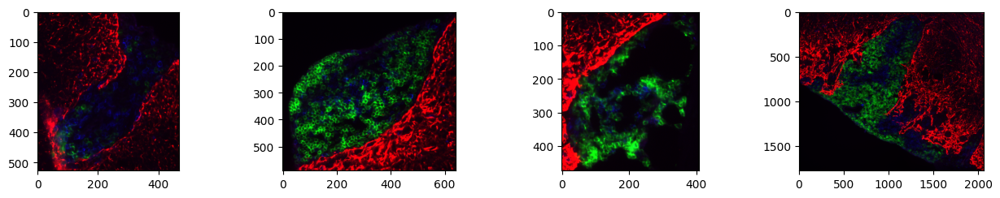

In [ ]:
images=[]
for file_name in ("/content/drive/MyDrive/Summer/Images/Western4-top.tif",
                  "/content/drive/MyDrive/Summer/Images/Western4-left.tif",
                  "/content/drive/MyDrive/Summer/Images/Western4-right.tif",
                  "/content/drive/MyDrive/Summer/Images/Western4-bottom.tif"):
  raw_tiff_file = tf.imread(file_name).astype(np.float64)
  raw_tiff_file = np.transpose(raw_tiff_file, (1, 2, 0))/4200
  images.append(raw_tiff_file)

fig = plt.figure(figsize=(20, 30))
for i in range(len(images)):
  fig.add_subplot(10, 5, i+1)
  plt.imshow(images[i][:,:,(0,1,3)]*6)

In [ ]:
#initialize dataframe
SUMMARY_ARRAY = pd.DataFrame(columns=['Channel', 'Baseline_Img', 'Count', 'Centroid_Coords'])               #Tile actually represents size

for i in (1,3): #for every channel ### CAN MAKE FOR ONLY CHOSEN CHANNELS , green, blue
  print(f"----------Channel green----------")

  #results = run_cellsam(tiles, channel = i)
  results = [segment_cellular_image(img[:,:,(i,i,i)], device=str(device)) for img in images]

  for j in range(len(results)): print(f"{get_num_cells(results[j][2])}")

  #add results to table
  channelEntries = [pd.DataFrame( {'Channel': i+1, 'Baseline_Img':numtile+1, 'Count':get_num_cells(result[2]), 'Centroid_Coords': [get_centroids(result[2], 200)] }) for numtile, result in enumerate(results)]
  SUMMARY_ARRAY = SUMMARY_ARRAY._append(channelEntries, ignore_index=True)

#export to file
#export_file_name = "Sanity_test"
export_file_name = f"Baseline_per_channel_exp_013"
SUMMARY_ARRAY.to_csv(f"{export_file_path}{export_file_name}.csv")
print(f"Data saved to {export_file_name}.")

----------Channel green----------


/usr/local/lib/python3.10/dist-packages/cellSAM/model.py:126: UserWarning: No cells detected in the image.
  warn("No cells detected in the image.")


In [ ]:
#file_name = "/content/drive/MyDrive/Summer/Images/Western4-left.tif"
#file_name = "/content/drive/MyDrive/Summer/Images/Western4-top.tif"
#file_name = "/content/drive/MyDrive/Summer/Images/Western4-bottom.tif"
file_name = "/content/drive/MyDrive/Summer/Images/Western4-right.tif"
raw_tiff_file = tf.imread(file_name).astype(np.float64)
raw_tiff_file = np.transpose(raw_tiff_file, (1, 2, 0))/4200
#raw_tiff_file = tiles[0]

centroids = []

for i in (3,1):
  print(f"----------Channel {i}----------")
  mask, emb, bb = segment_cellular_image(raw_tiff_file[:,:,i], device=str(device))

  print(f"Cell Count: {get_num_cells(bb)}")

  if bb is None: print("no cells")
  else:
    bb = bb.cpu().detach().numpy()/1024*raw_tiff_file.shape[0]  #x1, y1, x2, y2
    for x1, y1, x2, y2 in bb: centroids.append( ((x1+x2)/2, (y1+y2)/2) )

fig = plt.figure(figsize=(10, 10))
plt.imshow(raw_tiff_file[:,:,(0,1,3)]*6)
for point in centroids: plt.scatter(point[0], point[1], c='red')
plt.show()


In [ ]:
file_name = "/content/drive/MyDrive/Summer/Images/Western4-left.tif"
#file_name = "/content/drive/MyDrive/Summer/Images/Western4-top.tif"
#file_name = "/content/drive/MyDrive/Summer/Images/Western4-bottom.tif"
#file_name = "/content/drive/MyDrive/Summer/Images/Western4-right.tif"
raw_tiff_file = tf.imread(file_name).astype(np.float64)
raw_tiff_file = np.transpose(raw_tiff_file, (1, 2, 0))/4200
print(raw_tiff_file.shape)
#raw_tiff_file = tiles[9]

centroids = []

print(f"----------Channel all----------")
mask, emb, bb = segment_cellular_image(raw_tiff_file[:,:,(0,1,3)], device=str(device))

print(f"Cell Count: {get_num_cells(bb)}")

if bb is None: print("no cells")
else:
  bb = bb.cpu().detach().numpy()/1024  #x1, y1, x2, y2


(590, 642, 4)
----------Channel all----------
Cell Count: 15


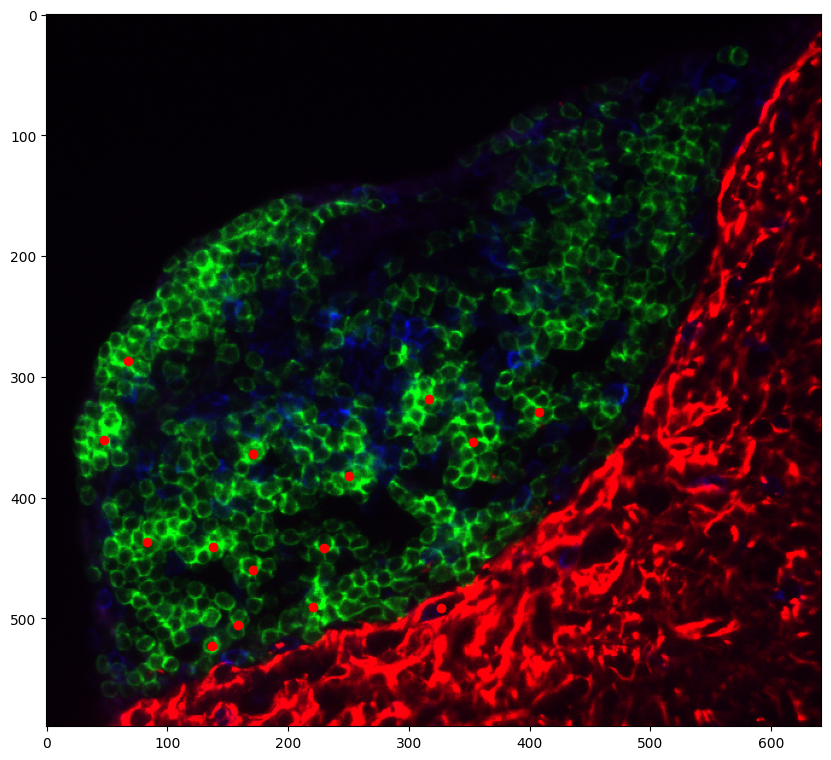

In [ ]:
centroids = []
for x1, y1, x2, y2 in bb: centroids.append( ((x1+x2)*raw_tiff_file.shape[1]/2, (y1+y2)*raw_tiff_file.shape[1]/2) )


fig = plt.figure(figsize=(10, 10))
plt.imshow(raw_tiff_file[:,:,(0,1,3)]*6)
for point in centroids: plt.scatter(point[0], point[1], c='red')
plt.show()

In [ ]:




fig = plt.figure(figsize=(20, 30))
for i in range(len(images)):
  fig.add_subplot(10, 5, i+1)
  plt.imshow(images[i][:,:,(0,1,3)]*6)

# Cell size trials

## A) Main size code

In [ ]:
# Set of images used for size experiments

file_name = "/content/drive/MyDrive/Summer/Images/Western4-left.tif"
raw_tiff_file = tf.imread(file_name).astype(np.float64)
raw_tiff_file = np.transpose(raw_tiff_file, (1, 2, 0))/4200

# Left (WORKS- no blue)
x=400
y=400

# Bottom (WORKS - no blue)
x=600
y=650

# Right (WORKS - no blue)
x=256 # bottom right(works) best
y=445

# Top (BLUE ONLY - 3 bottom right)
x=180
y=510

x=144 #(has blue - bottom left)
y=507

tile=raw_tiff_file[y-100:y,x-100:x, :]
plt.imshow(tile[:,:,(0,1,3)]*6)

In [ ]:
#cell size trials

file_name = "/content/drive/MyDrive/Summer/Images/Western4-top.tif"
raw_tiff_file = tf.imread(file_name).astype(np.float64)
raw_tiff_file = np.transpose(raw_tiff_file, (1, 2, 0))/4200

x=180
y=510

tiles=[raw_tiff_file[y-100:y,x-100:x, :] for s in range(100,600,10)]

expected_size = [*range(100,600,10)]
for i in range(len(tiles)): #add padding to tiles outside of region
    if tiles[i].shape[0] != expected_size[i]:
      padding = np.zeros( shape=(expected_size[i],expected_size[i],raw_tiff_file.shape[2]), dtype=np.float64)
      padding[0:tiles[i].shape[0], 0:tiles[i].shape[1], :] = tiles[i]
      tiles[i] = padding

print(len(tiles))

#initialize dataframe
SUMMARY_ARRAY = pd.DataFrame(columns=['Channel', 'Size', 'Count', 'Centroid_Coords'])               #Tile actually represents size

for i in (1,3): #for every channel ### CAN MAKE FOR ONLY CHOSEN CHANNELS , green, blue
  print(f"----------Channel green----------")

  #results = run_cellsam(tiles, channel = i)
  results = [segment_cellular_image(img[:,:,i], device=str(device)) for img in tiles]

  for j in range(len(results)):
    print(f"Tile {j}: {get_num_cells(results[j][2])}")

  #add results to table
  channelEntries = [pd.DataFrame( {'Channel': i+1, 'Size':numtile*10+100, 'Count':get_num_cells(result[2]), 'Centroid_Coords': [get_centroids(result[2], numtile*10+100)] }) for numtile, result in enumerate(results)]
  SUMMARY_ARRAY = SUMMARY_ARRAY._append(channelEntries, ignore_index=True)

#export to file
#export_file_name = "Sanity_test"
export_file_name = "Sizes_Exp_top_100-600_green_blue"
SUMMARY_ARRAY.to_csv(f"{export_file_path}{export_file_name}.csv")
print(f"Data saved to {export_file_name}.")


## B) CPU & visualization code

In [ ]:
#CPU Only
file_name = "/content/drive/MyDrive/Summer/Images/Western4-top.tif"
raw_tiff_file = tf.imread(file_name).astype(np.float64)
raw_tiff_file = np.transpose(raw_tiff_file, (1, 2, 0))/4200

x=180
y=510


tiles=[raw_tiff_file[y-100:y,x-100:x, :] for s in range(100,600,10)]

expected_size = [*range(100,600,10)]
for i in range(len(tiles)): #add padding to tiles outside of region
    if tiles[i].shape[0] != expected_size[i]:
      padding = np.zeros( shape=(expected_size[i],expected_size[i],raw_tiff_file.shape[2]), dtype=np.float64)
      padding[0:tiles[i].shape[0], 0:tiles[i].shape[1], :] = tiles[i]
      tiles[i] = padding

#fix string reading

export_file_name = "/content/drive/MyDrive/Summer/Images/Sizes_Exp_top_100-600_green_blue.csv"

import ast
SUMMARY_ARRAY = pd.read_csv(export_file_name)
SUMMARY_ARRAY['Centroid_Coords'] = SUMMARY_ARRAY['Centroid_Coords'].apply(lambda coords: ast.literal_eval(coords))


In [ ]:
#Check split images with markings

fig = plt.figure(figsize=(20, 30))
#for i in range(len(tiles)):
#for i in range(16,22,1):
#for i in (14,15,16, 17):
if True:
  i=0
  fig.add_subplot(10, 5, i+1)
  plt.imshow(tiles[0][:,:,(0, 1, 3)]*6, zorder=1)
  #plt.imshow(tiles[i][:,:,(0, 1, 3)]*6, zorder=1)
  centroidsA = [v for val in SUMMARY_ARRAY.loc[ (SUMMARY_ARRAY['Size']==i*10+100), ['Centroid_Coords']].to_numpy().flatten().tolist() for v in val]
  for point in centroidsA: plt.scatter(point[0], point[1], c='red', marker='o', zorder=2)

  #centroidsB = [v for val in SUMMARY_ARRAY.loc[ (SUMMARY_ARRAY['Tile']==i+1) & (SUMMARY_ARRAY['Channel']==4), ['Centroid_Coords']].to_numpy().flatten().tolist() for v in val]
  #for point in centroidsB: plt.scatter(point[0], point[1], c='red', marker='o', zorder=3)

plt.show()

  #overlay colorsdisplay_bounding_boxes(img, centroids = centroids)

# Sharpening/Normalization Trials

----------/content/drive/MyDrive/Summer/Images/Western4-top.tif----------
----------/content/drive/MyDrive/Summer/Images/Western4-left.tif----------
----------/content/drive/MyDrive/Summer/Images/Western4-right.tif----------
----------/content/drive/MyDrive/Summer/Images/Western4-bottom.tif----------


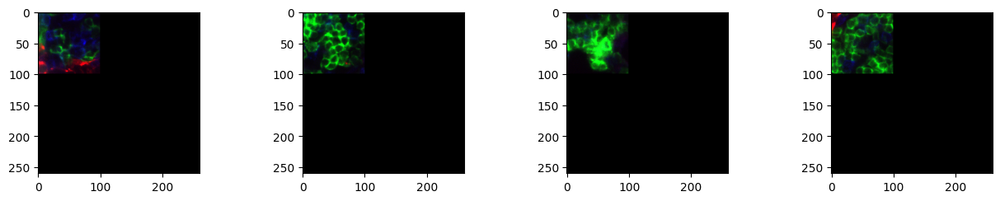

In [ ]:
# Set of images used for size experiments

tiles = []
file_names = ["/content/drive/MyDrive/Summer/Images/Western4-top.tif",
              "/content/drive/MyDrive/Summer/Images/Western4-left.tif",
              "/content/drive/MyDrive/Summer/Images/Western4-right.tif",
              "/content/drive/MyDrive/Summer/Images/Western4-bottom.tif"]

for i in range(len(file_names)):
  print(f"----------{file_names[i]}----------")
  raw_tiff_file = tf.imread(file_names[i]).astype(np.float64)
  raw_tiff_file = np.transpose(raw_tiff_file, (1, 2, 0))

  match i:
    case 0: x, y = 180, 510   # Top (BLUE ONLY - 3 bottom right)
    case 1: x, y = 400, 400   # Left
    case 2: x, y = 256, 445   # Right
    case 3: x, y = 600, 650   # Bottom

  tile=raw_tiff_file[y-100:y,x-100:x, :] # NOTE: NOT SCALED YET [0,4095]
  padding = np.zeros( shape=(260,260,tile.shape[2]), dtype=np.float64)
  padding[0:tile.shape[0], 0:tile.shape[1], :] = tile
  tile = padding

  tiles.append(tile)

fig = plt.figure(figsize=(20, 30))
for i in range(len(tiles)):
  fig.add_subplot(10, 5, i+1)
  plt.imshow(tiles[i][:,:,(0,1,3)]*6/4200)


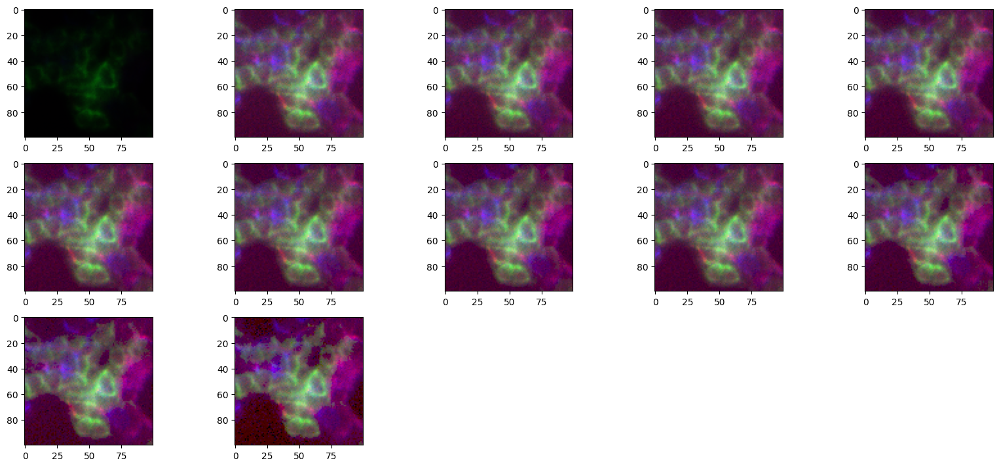

In [ ]:
import cv2
k=2
tile = np.copy(tiles[k])/4200
images = []

### BRIGHTENING + CONTRAST

# Channel Dependent Scaling
channel_scaled = np.copy(tile*4200) #NOTE: Use unscaled for this
for c in range(tile.shape[2]): channel_scaled[:,:,c] = tile[:,:,c]/max(tile[:,:,c].flatten()) #scale to based on max

# Log scaling (before normalization)
log_scaled = np.log1p(np.copy(tile)*4200)  # Use log1p to handle zero values properly
log_scaled_undivided_channel = np.copy(log_scaled)
for c in range(tile.shape[2]): log_scaled_undivided_channel[:,:,c] = log_scaled[:,:,c]/max(log_scaled[:,:,c].flatten()) #scale to based on max
log_scaled_undivided_max = (log_scaled / np.max(log_scaled.flatten())) # Normalize the log-scaled image to the range [0, 1]
# Log scaling (after normalization)
log_scaled_divided = np.log1p(np.copy(tile) )
log_scaled_divided2 = np.log1p(np.copy(channel_scaled))

# Histogram Equallization
hist_equa = np.copy(tile*255).astype(np.uint8) #NOTE: Use unscaled for this
for c in range(tile.shape[2]): hist_equa[:,:,c] = cv2.equalizeHist(hist_equa[:,:,c])
hist_equa = hist_equa/255

hist_equa2 = np.copy(channel_scaled*255).astype(np.uint8) #NOTE: Use unscaled for this
for c in range(tile.shape[2]): hist_equa2[:,:,c] = cv2.equalizeHist(hist_equa2[:,:,c])
hist_equa2 = hist_equa2/255

#log scale down, then per channel normalization
log_then_channel = np.copy(log_scaled)
for c in range(tile.shape[2]): log_then_channel[:,:,c] = log_scaled[:,:,c]/max(log_scaled[:,:,c].flatten())

# Gamma Correction
gamma125 = np.copy(tile)
gamma15 = np.copy(tile)
gamma175 = np.copy(tile)
gamma2 = np.copy(tile)
gamma25 = np.copy(tile)
gamma3 = np.copy(tile)
gamma4 = np.copy(tile)
for c in range(tile.shape[2]): #gamma correction for every channel
  gamma125[:,:,c] = np.power(tile[:,:,c], 1/1.25)
  gamma15[:,:,c] = np.power(tile[:,:,c], 1/1.5)
  gamma175[:,:,c] = np.power(tile[:,:,c], 1/1.75)
  gamma2[:,:,c] = np.power(tile[:,:,c], 1/2)
  gamma25[:,:,c] = np.power(tile[:,:,c], 1/2.5)
  gamma3[:,:,c] = np.power(tile[:,:,c], 1/3)
  gamma4[:,:,c] = np.power(tile[:,:,c], 1/4)


# Scaled Gamma
scaled_gamma15 = np.copy(channel_scaled)
scaled_gamma2 = np.copy(channel_scaled)
scaled_gamma125 = np.copy(channel_scaled)
scaled_gamma175 = np.copy(channel_scaled)
scaled_gamma15 = np.power(channel_scaled, 1/1.5)
scaled_gamma2 = np.power(channel_scaled, 1/2)
scaled_gamma125 = np.power(channel_scaled, 1/1.25)
scaled_gamma175 = np.power(channel_scaled, 1/1.75)

#clipping scaled
s_remove001_g = np.copy(channel_scaled)
s_remove005_g = np.copy(channel_scaled)
s_remove007_g = np.copy(channel_scaled)
s_remove010_g = np.copy(channel_scaled)
s_remove001_g[s_remove001_g < 0.01] = 0
s_remove005_g[s_remove005_g < 0.05] = 0
s_remove007_g[s_remove007_g < 0.07] = 0
s_remove010_g[s_remove010_g < 0.10] = 0
s_remove001_g = np.power(s_remove001_g, 1/1.5)
s_remove005_g = np.power(s_remove005_g, 1/1.5)
s_remove007_g = np.power(s_remove007_g, 1/1.5)
s_remove010_g = np.power(s_remove010_g, 1/1.5)


# Clipping after scaling (see if improves count from scaled_gamma15)
remove001 = np.copy(scaled_gamma15)
remove002 = np.copy(scaled_gamma15)
remove003 = np.copy(scaled_gamma15)
remove004 = np.copy(scaled_gamma15)
remove005 = np.copy(scaled_gamma15)
remove007 = np.copy(scaled_gamma15)
remove010 = np.copy(scaled_gamma15)
remove001[remove001 < 0.01] = 0
remove002[remove002 < 0.02] = 0
remove003[remove003 < 0.03] = 0
remove004[remove004 < 0.04] = 0
remove005[remove005 < 0.05] = 0
remove007[remove007 < 0.07] = 0
remove010[remove010 < 0.10] = 0


# Gaussian Blur after removal
remove005_gb = cv2.GaussianBlur(np.copy(remove005), (5, 5), 0)


import cv2
gaussian_blur = cv2.GaussianBlur(tile, (5, 5), 0)
scaled_gaussian = cv2.GaussianBlur(channel_scaled, (5, 5), 0)
scaled_gaussian_gamma15 = cv2.GaussianBlur(scaled_gamma15, (5, 5), 0)
scaled_gaussian_gamma2 = cv2.GaussianBlur(scaled_gamma2, (5, 5), 0)

# Gaussian, then remove
sg_remove001 = cv2.GaussianBlur(np.copy(gaussian_blur), (5, 5), 0)
sg_remove005 = cv2.GaussianBlur(np.copy(gaussian_blur), (5, 5), 0)
sg_remove010 = cv2.GaussianBlur(np.copy(gaussian_blur), (5, 5), 0)
sg_remove020 = cv2.GaussianBlur(np.copy(gaussian_blur), (5, 5), 0)

sgg_remove001 = cv2.GaussianBlur(np.copy(remove001), (5, 5), 0)

#add to list of images to test
images.append(tile)
'''
images.append(channel_scaled)
images.append(log_scaled_undivided_max)
images.append(log_scaled_undivided_channel)
images.append(log_scaled_divided)
images.append(log_scaled_divided2)
images.append(hist_equa)
images.append(hist_equa2)
images.append(log_then_channel)
images.append(gamma125)
images.append(gamma15)
images.append(gamma175)
images.append(gamma2)
images.append(gamma25)
images.append(gamma3)
images.append(gamma4)
images.append(scaled_gamma125)
images.append(scaled_gamma15)
images.append(scaled_gamma175)
images.append(scaled_gamma2)

'''


images.append(remove001)
images.append(remove002)
images.append(remove003)
images.append(remove004)
images.append(remove005)
images.append(remove007)
images.append(remove010)

images.append(s_remove001_g)
images.append(s_remove005_g)
images.append(s_remove007_g)
images.append(s_remove010_g)

'''
images.append(gaussian_blur)
images.append(scaled_gaussian)
images.append(scaled_gaussian_gamma15)
images.append(scaled_gaussian_gamma2)

images.append(s_remove001)
images.append(s_remove005)
images.append(s_remove010)
images.append(s_remove020)

images.append(sg_remove001)
images.append(sg_remove005)
images.append(sg_remove010)
images.append(sg_remove020)
'''
#visualize
fig = plt.figure(figsize=(20, 30))
for i in range(len(images)):
  fig.add_subplot(10, 5, i+1)
  plt.imshow(images[i][0:100,0:100,(0,1,3)])


In [ ]:
#initialize dataframe
SUMMARY_ARRAY = pd.DataFrame(columns=['Channel', 'Type', 'Count', 'Centroid_Coords'])               #Tile actually represents size

for i in (1,3): #for every channel ### CAN MAKE FOR ONLY CHOSEN CHANNELS , green, blue
  print(f"----------Channel green----------")

  #results = run_cellsam(tiles, channel = i)
  results = [segment_cellular_image(img[:,:,i], device=str(device)) for img in images]

  for j in range(len(results)): print(f"{get_num_cells(results[j][2])}")

  #add results to table
  channelEntries = [pd.DataFrame( {'Channel': i+1, 'Type':numtile+1, 'Count':get_num_cells(result[2]), 'Centroid_Coords': [get_centroids(result[2], 260)] }) for numtile, result in enumerate(results)]
  SUMMARY_ARRAY = SUMMARY_ARRAY._append(channelEntries, ignore_index=True)

#export to file
#export_file_name = "Sanity_test"
export_file_name = f"Sharpen_Exp_{k}_green_blue_test_clip_gamma15_before_after"
SUMMARY_ARRAY.to_csv(f"{export_file_path}{export_file_name}.csv")
print(f"Data saved to {export_file_name}.")

In [ ]:
#initialize dataframe
SUMMARY_ARRAY = pd.DataFrame(columns=['Channel', 'Type', 'Count', 'Centroid_Coords'])               #Tile actually represents size

for i in (1,3): #for every channel ### CAN MAKE FOR ONLY CHOSEN CHANNELS , green, blue
  print(f"----------Channel green----------")

  #results = run_cellsam(tiles, channel = i)
  results = [segment_cellular_image(img[:,:,i], device=str(device)) for img in images]

  for j in range(len(results)): print(f"{get_num_cells(results[j][2])}")

  #add results to table
  channelEntries = [pd.DataFrame( {'Channel': i+1, 'Type':numtile+1, 'Count':get_num_cells(result[2]), 'Centroid_Coords': [get_centroids(result[2], 260)] }) for numtile, result in enumerate(results)]
  SUMMARY_ARRAY = SUMMARY_ARRAY._append(channelEntries, ignore_index=True)

#export to file
#export_file_name = "Sanity_test"
export_file_name = f"Sharpen_Exp_{k}_green_blue_test_clip_gamma15_before_after"
SUMMARY_ARRAY.to_csv(f"{export_file_path}{export_file_name}.csv")
print(f"Data saved to {export_file_name}.")

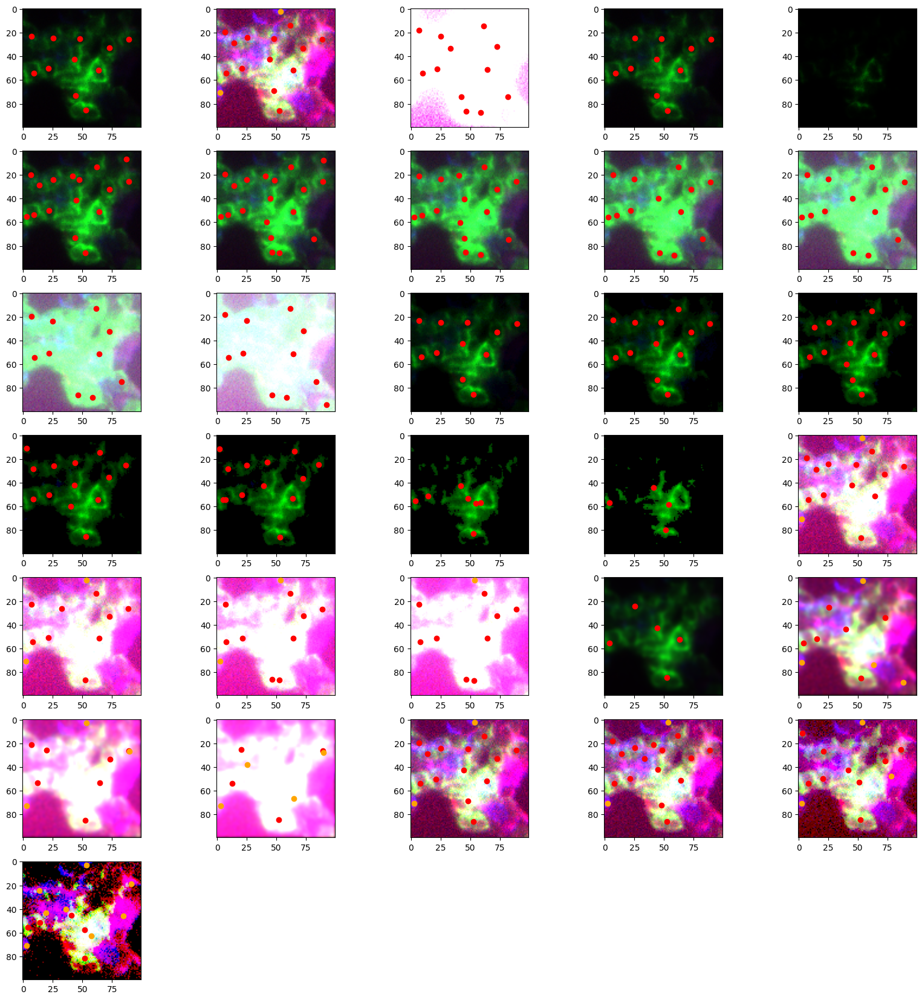

In [ ]:
#Check split images with markings

fig = plt.figure(figsize=(20, 30))
for i in range(len(images)):
#for i in range(16,22,1):
#for i in (14,15,16, 17):
#if True:
  #i=0
  fig.add_subplot(10, 5, i+1)
  #plt.imshow(images[0][:,:,(0, 1, 3)]*6, zorder=1)
  plt.imshow(images[i][0:100,0:100,(0, 1, 3)]*3, zorder=1)
  #plt.imshow(images[i]:,:,(0, 1, 3)], zorder=1)
  centroidsA = [v for val in SUMMARY_ARRAY.loc[ (SUMMARY_ARRAY['Type']==i+1) & (SUMMARY_ARRAY['Channel']==2), ['Centroid_Coords']].to_numpy().flatten().tolist() for v in val]
  for point in centroidsA: plt.scatter(point[0], point[1], c='red', marker='o', zorder=2)

  centroidsB = [v for val in SUMMARY_ARRAY.loc[ (SUMMARY_ARRAY['Type']==i+1) & (SUMMARY_ARRAY['Channel']==4), ['Centroid_Coords']].to_numpy().flatten().tolist() for v in val]
  for point in centroidsB: plt.scatter(point[0], point[1], c='orange', marker='o', zorder=3)

plt.show()

  #overlay colorsdisplay_bounding_boxes(img, centroids = centroids)

## Temp

In [ ]:
# Left (WORKS- no blue)
x=400
y=400

# Bottom (WORKS - no blue)
x=600
y=650

# Right (WORKS - no blue)
x=256 # bottom right(works) best
y=445

# Top (BLUE ONLY - 3 bottom right)
x=180
y=510

x=144 #(has blue - bottom left)
y=507

x=256 # bottom right(works) best
y=445

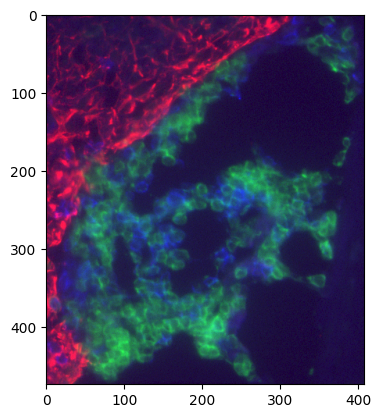

In [ ]:
#raw_tiff_file2 = np.copy(raw_tiff_file)

for c in range(raw_tiff_file.shape[2]):
  raw_tiff_file[:,:,c] = np.power(raw_tiff_file2[:,:,c], 1/2.5) #gamma correction

#raw_tiff_file2 = gamma_correction(raw_tiff_file, 0.5)  # Function to apply gamma correction
plt.imshow(raw_tiff_file[:,:,(0,1,3)])

#Main Function

In [ ]:
#CPU Only
#cd = get_crop_dimentions(cell_size)
cd=260                                                     # TEMP HARD CODED (can try 270 if time)
tiles = get_tiles(im=raw_tiff_file, yDim=cd, xDim=cd)
print(f"Dimentions for tiles: {cd}")
print(f"Total of {len(tiles)} tiles")

#fix string reading
import ast
export_file_name = "SUMMARY_4_scaled_gamma15_left"
export_file_name = f"{export_file_path}{export_file_name}.csv"
SUMMARY_ARRAY = pd.read_csv(export_file_name)
SUMMARY_ARRAY['Centroid_Coords'] = SUMMARY_ARRAY['Centroid_Coords'].apply(lambda coords: ast.literal_eval(coords))


Dimentions for tiles: 260
Total of 9 tiles


In [ ]:
# MAIN

#Crop file to appropriate dimentions
#cd = get_crop_dimentions(cell_size)
cd=260                                                     # TEMP HARD CODED (can try 270 if time)
tiles = get_tiles(im=raw_tiff_file, yDim=cd, xDim=cd)
print(f"Dimentions for tiles: {cd}")
print(f"Total of {len(tiles)} tiles")

#initialize dataframe
SUMMARY_ARRAY = pd.DataFrame(columns=['Channel', 'Tile', 'Count', 'Centroid_Coords'])
cells_per_channel = []


for i in (1,3): #for every channel ### CAN MAKE FOR ONLY CHOSEN CHANNELS
  print(f"----------Channel {i+1}----------")

  #results = run_cellsam(tiles, channel = i)
  results = [segment_cellular_image(img[:,:,i], device=str(device)) for img in tiles]

  #add results to tables
  channelEntries = [pd.DataFrame( {'Channel':i+1, 'Tile':numtile+1, 'Count':get_num_cells(result[2]), 'Centroid_Coords': [get_centroids(result[2],cd)] }) for numtile, result in enumerate(results)]
  SUMMARY_ARRAY = SUMMARY_ARRAY._append(channelEntries, ignore_index=True)

  #calculate total number of cells for this channel
  cells_per_channel.append( SUMMARY_ARRAY.loc[SUMMARY_ARRAY['Channel']==i+1, ['Count'] ].sum()[0] )
  print(f"Total number of cells in channel {i+1}: {cells_per_channel[-1]}")


export_file_name = "SUMMARY_4_scaled_gamma15_bottom"
#export to file
SUMMARY_ARRAY.to_csv(f"{export_file_path}{export_file_name}.csv")
pd.DataFrame({'Channel': range(2,4), 'Total_Cell_Count': cells_per_channel}).to_csv(f"{export_file_path}{export_file_name}_small.csv")                      ###FIX THE RANGE AFTER!!
print("Data saved to file.")

#Channels info: (1=white, 2=yellow, 3=pink, 4=cyan)

Dimentions for tiles: 260
Total of 56 tiles
----------Channel 2----------


100%|██████████| 784M/784M [00:23<00:00, 33.2MiB/s]
/usr/local/lib/python3.10/dist-packages/cellSAM/model.py:126: UserWarning: No cells detected in the image.
  warn("No cells detected in the image.")
<ipython-input-6-057dadd14fd9>:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cells_per_channel.append( SUMMARY_ARRAY.loc[SUMMARY_ARRAY['Channel']==i+1, ['Count'] ].sum()[0] )


Total number of cells in channel 2: 2712
----------Channel 4----------


/usr/local/lib/python3.10/dist-packages/cellSAM/model.py:126: UserWarning: No cells detected in the image.
  warn("No cells detected in the image.")


Total number of cells in channel 4: 1323
Data saved to file.


<ipython-input-6-057dadd14fd9>:26: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  cells_per_channel.append( SUMMARY_ARRAY.loc[SUMMARY_ARRAY['Channel']==i+1, ['Count'] ].sum()[0] )


# Tile Visualizations

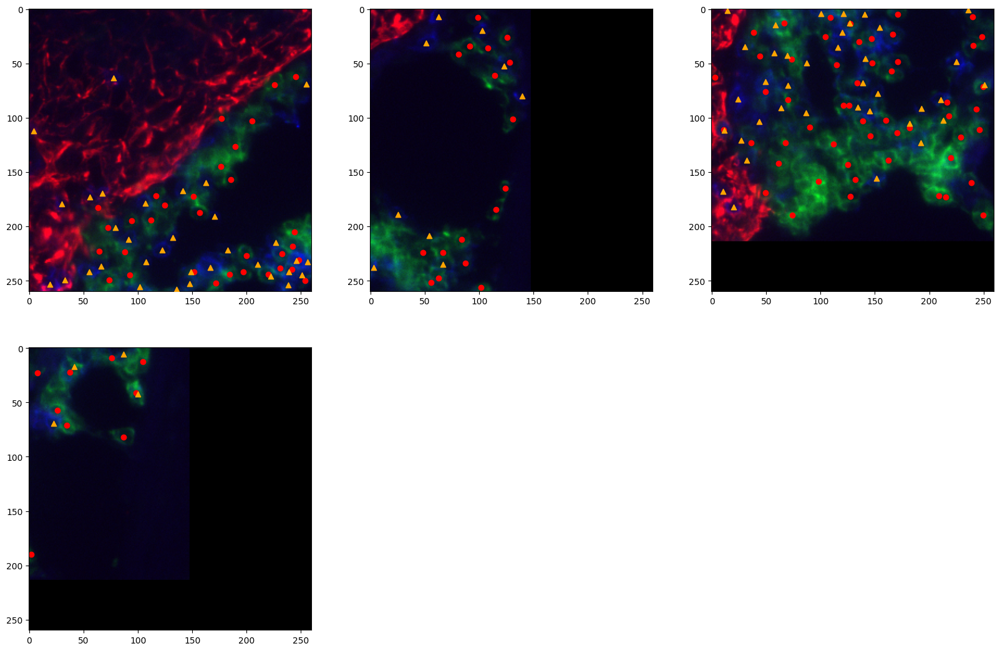

In [ ]:
#Check split images with markings

fig = plt.figure(figsize=(20, 20))
for i in range(len(tiles)):
#for i in (2,11):
  fig.add_subplot(3, 3, i+1)
  plt.imshow(tiles[i][:,:,(0, 1, 3)], zorder=1)
  #plt.imshow(tiles[i][:,:,(0, 1, 3)]*4, zorder=1)
  centroidsA = [v for val in SUMMARY_ARRAY.loc[ (SUMMARY_ARRAY['Tile']==i+1) & (SUMMARY_ARRAY['Channel']==2), ['Centroid_Coords']].to_numpy().flatten().tolist() for v in val]
  for point in centroidsA: plt.scatter(point[0], point[1], c='red', marker='o', zorder=2)

  centroidsB = [v for val in SUMMARY_ARRAY.loc[ (SUMMARY_ARRAY['Tile']==i+1) & (SUMMARY_ARRAY['Channel']==4), ['Centroid_Coords']].to_numpy().flatten().tolist() for v in val]
  for point in centroidsB: plt.scatter(point[0], point[1], c='orange', marker='^', zorder=3)

plt.show()

  #overlay colorsdisplay_bounding_boxes(img, centroids = centroids)

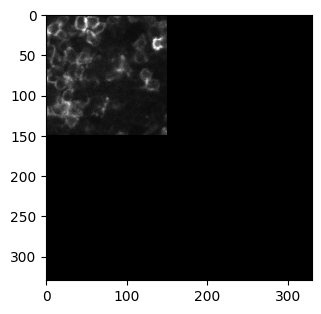

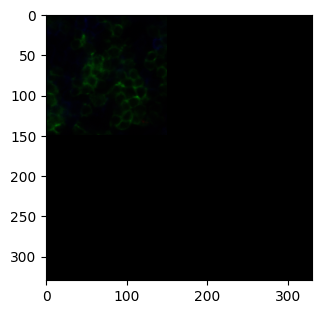

In [ ]:
tileNum = 9

fig = plt.figure(figsize=(20, 20))
fig.add_subplot(5, 5, 1)
plt.imshow(tiles[tileNum][:,:,(3,3,3)]*9, zorder=1)
#plt.imshow(tiles[tileNum][:,:,3], cmap='gray',vmax=0.1, zorder=1)
centroids = [v for val in SUMMARY_ARRAY.loc[SUMMARY_ARRAY['Size']==tileNum+1, ['Centroid_Coords']].to_numpy().flatten().tolist() for v in val]
for point in centroids: plt.scatter(point[0], point[1], c='red', zorder=2)


fig = plt.figure(figsize=(20, 20))
fig.add_subplot(5, 5, 2)
plt.imshow(tiles[tileNum][:,:,(0,1,3)], zorder=1)
#plt.imshow(tiles[tileNum][:,:,3], cmap='gray',vmax=0.5, zorder=1)
#centroids = [v for val in SUMMARY_ARRAY.loc[SUMMARY_ARRAY['Tile']==tileNum+1, ['Centroid_Coords']].to_numpy().flatten().tolist() for v in val]
for point in centroids: plt.scatter(point[0], point[1], c='red', zorder=2)


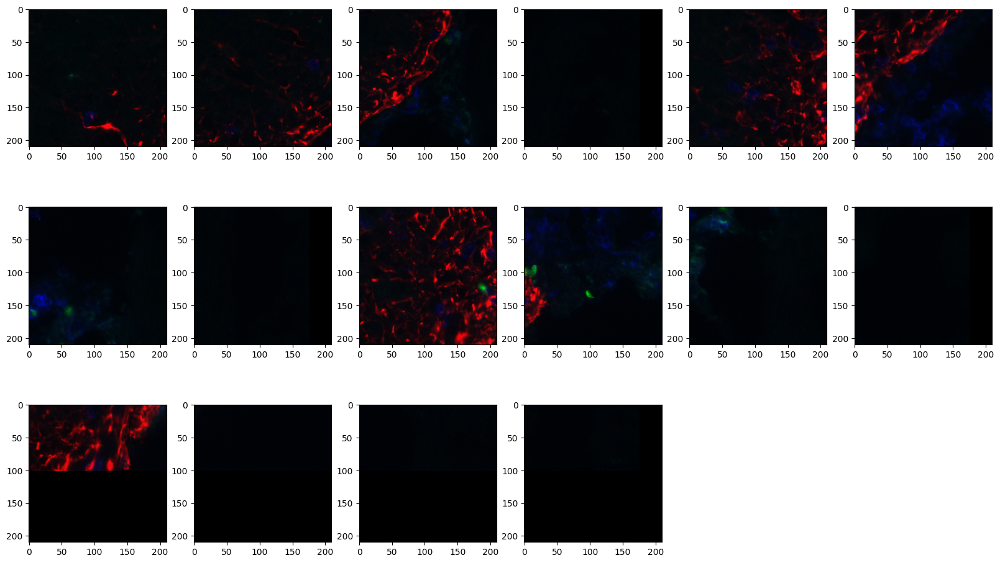

In [ ]:
#Check split images

fig = plt.figure(figsize=(20, 20))
for i in range(len(tiles)):
  fig.add_subplot(5, 6, i+1)
  plt.imshow(tiles[i][:,:,(0,2,3)])
  #overlay colors

#Other?

In [ ]:
#Scale to full image

cd = get_crop_dimentions(cell_size)
tiles = get_tiles(im=raw_tiff_file, yDim=cd, xDim=cd)
print(f"Dimentions for tiles: {cd}")
print(f"Total of {len(tiles)} tiles")

#______________________________________

rows=5
cols=5
whole_img = None

### TILES
for r in range(rows):
  row=tiles[r*cols] #initialize
  for c in range(1,cols):
    row = np.concatenate((row, tiles[r*cols+c]), axis=1)
  if whole_img is None: whole_img=row; print(f"SHAPE: {whole_img.shape}")
  else: whole_img.shape; whole_img=np.concatenate((whole_img, row), axis=0)

plt.imshow(whole_img)

rows=5
cols=5
whole_mask = None

cellcount=0

### MASKS
for r in range(rows):
  row=None #prep empty row

  for c in range(cols):

    #get the tile and unique id for each cell identified
    print(f"Tile {r*cols+c}: ") #r*cols+c is the tile number


    #Get a tile to append
    # 1. if no cells detected --> tiles = numpy array of zeros
    # 2. else, we will make a copy of tiles, with the cell count added
    # 3.    search and replace any matching cellcount with zeros
    # 4. finally, update the cellcount

    if get_total_count(results[r*cols+c])) == 0: #..........check if this works
      tile = np.zeros(shape=(cd,cd))
    else:
      tile=np.copy(results[r*cols+c][0]+cellcount)
      tiles[tiles==cellcount] = 0
    cellcount += get_total_count(results[r*cols+c])

    # for every tile, if it's the beginning of the row, initialize it, else, concatonate it to the row
    if row is None: row = tile
    else: row = np.concatenate((row, tile[0]), axis=1)

  # for every row, if it's the beginning of the whole mask, initialize it, else, concatonate it to the existing mask
  if whole_mask is None: whole_mask=row
  else: whole_mask=np.concatenate((whole_mask, row), axis=0)

  print(f"SHAPE: {whole_mask.shape}")


# Get fill list of centroids scaled to full image
# 1. get the scaled centroids (x,y)
# 2. for every centroid, scale the x by x*r*cd and y by y*c*cd
# 3. save to whole_centroids

"""
controids = None

for r in range(rows):
  for c in range(cols):
    tileCent = get_centroids(results[r*cols+c][2])

    #?tileCent = np.array(tileCent)


    tileCent[:,0] = tileCent[:,0]*c*cd    #this is the y-value
    tileCent[:,1] = tileCent[:,1]*r*cd    #this is the x-value

    controids.append(tileCent) ###is append right... maybe np.concatnate is better... dep if we want per tile or not I think
        if results[r*cols][0] is not None: row = np.concatenate((row, results[r*cols][0]), axis=2)

    centroids
    """


SyntaxError: unmatched ')' (<ipython-input-6-13cb3577c387>, line 46)

In [ ]:
cd = get_crop_dimentions(cell_size)
tiles = get_tiles(im=raw_tiff_file, yDim=cd, xDim=cd)
print(f"Dimentions for tiles: {cd}")
print(f"Total of {len(tiles)} tiles")

#______________________________________

rows=5
cols=5
whole_mask = []

### TILES
for r in range(rows):
  row=[]
  for c in range(cols):
    row.append(tiles[r*cols+c])
  whole_mask.append(row)

### MASK
results[tile#][0-mask]

for i in results: #for every tile
  if i[0] is not None: # if mask is not empty
    for r in range(rows):

      for c in range(cols):
        whole_mask[r][c] = [i[0]] ##first find row dimentions somehow (function?)
  else:
    print("Empty mask")
    padding = np.zeros(shape=(cd,cd,raw_tiff_file.shape[2]), dtype=np.float64)
    #add empty array


In [ ]:
#now need to A) fix tiling [DONE], B) optimize mask generation[CANT...], C) get relative location.
#- send image to Steven Kerfoot, check if useful, and per channel output.
#- ask Dr. Lalonde if he has cell-like images to test scale on

#Do we need to visualize the whole image again? YES
#put back together to visualize whole image row0=[tiles[0],tiles[1],tiles[2]] and row1=[tiles[3],tiles[4],tiles[5]]
#  six tiles with 2 rows and 3 columns

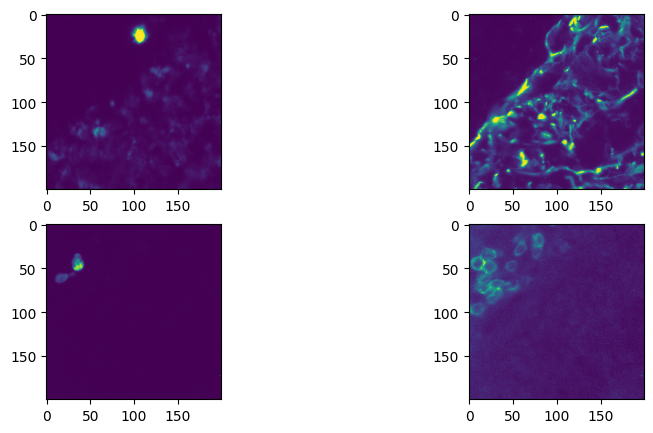

In [ ]:
#Temp visualization
#plt.imshow(tiles[2][:,:, (3, 3, 3)])
i=16
fig = plt.figure(figsize=(10, 5))
fig.add_subplot(2, 2, 1) #before
plt.imshow(tiles[i][:,:, 0]) #21?
fig.add_subplot(2, 2, 2)
plt.imshow(tiles[i][:,:, 1]) #84?
fig.add_subplot(2, 2, 3)
plt.imshow(tiles[i][:,:, 2]) #0?
fig.add_subplot(2, 2, 4)
plt.imshow(tiles[i][:,:, 3]) #?



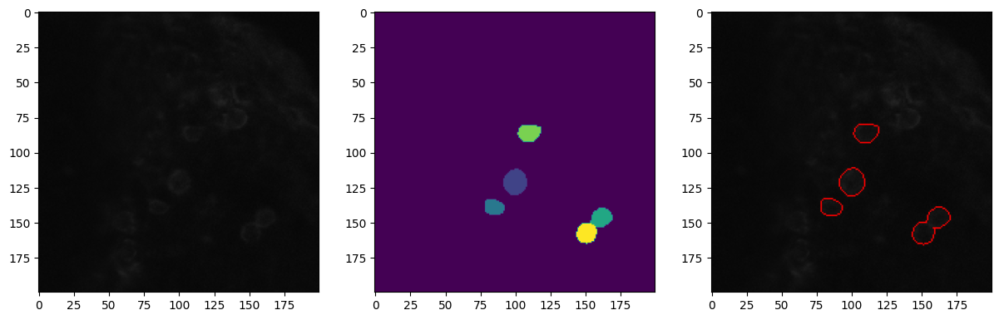

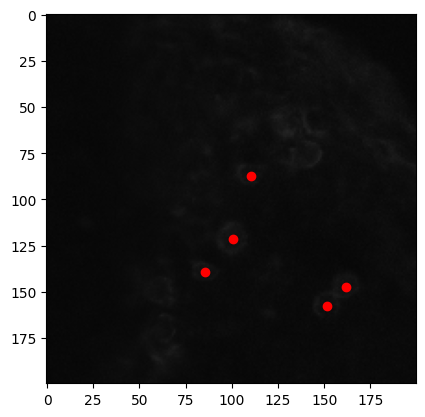

In [ ]:
# Output image of one particular tile (visualization)
i=1
img = tiles[i][:,:, (3, 3, 3)]

#Plot before and after
fig = plt.figure(figsize=(20, 5))
fig.add_subplot(1, 4, 1) #before
plt.imshow(img)
fig.add_subplot(1, 4, 2) #after
plt.imshow(results[i][0])

#Plot superimposed
fig.add_subplot(1, 4, 3) #superimposed
pred_mask = results[i][0] #mask
dilated_mask = binary_dilation(pred_mask)
edges = dilated_mask ^ pred_mask

full_img = np.array([img[:, :, -1]] * 3).transpose((1,2,0))
r, c = np.where(np.isclose(1.0, edges))
full_img[r, c] = [1,0,0]
plt.imshow(full_img)

bb = scale_bounding_boxes(results[i][2], 200)
#print ("Number of cells: ", get_num_cells())
centroids = get_centroids(bb)
#fig.add_subplot(1, 4, 4)
display_bounding_boxes(img, centroids = centroids)


# Test with whole image (Awful results, thus wrapper/pipeline needed)

(898, 908, 4)

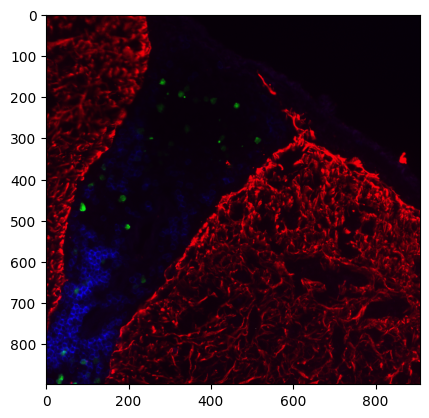

In [ ]:
### RBG one color channel scaled to 0-1, duplicated 3 times, and zoomed in

#load file
file_name = "/content/drive/MyDrive/Summer/Images/Western1-9.tif"
raw_tiff_file = tf.imread(file_name)

#process image and run cellSAM
img = np.transpose(raw_tiff_file, (1, 2, 0))/4200 # H, W, C # REMOVE WHEN PUT TOGETHER
plt.imshow(img[:,:,(1,2,3)])
img.shape

In [ ]:
#load file
file_name = "/content/drive/MyDrive/Summer/Images/Western1-9.tif"
raw_tiff_file = tf.imread(file_name)
s=img.shape[0]

#process image and run cellSAM
img = np.transpose(raw_tiff_file, (1, 2, 0))/4200 # H, W, C # REMOVE WHEN PUT TOGETHER
img = img[:,:,(1,2,3)]
mask, embedding, bounding_boxes = segment_cellular_image(img, device=str(device))

Number of cells:  2


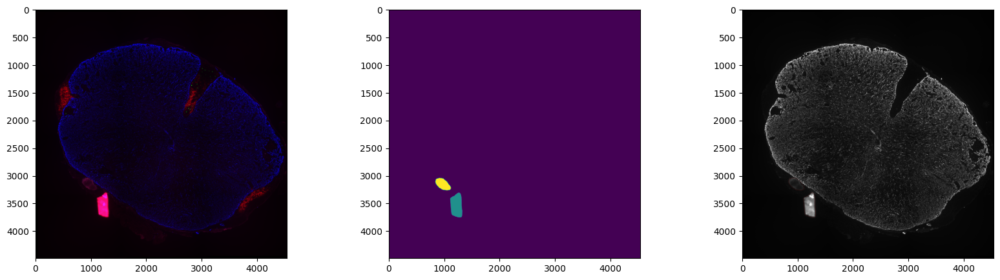

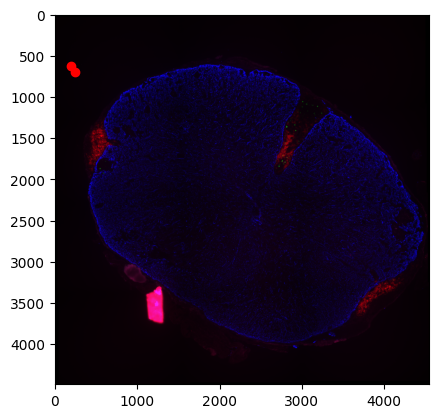

In [ ]:
#VERY VERY LARGE IMAGE ISSUES




#VISUALIZE

#Plot before and after
fig = plt.figure(figsize=(20, 5))
fig.add_subplot(1, 3, 1) #before
plt.imshow(img)
fig.add_subplot(1, 3, 2) #after
plt.imshow(mask)

#Plot superimposed
fig.add_subplot(1, 3, 3) #superimposed
pred_mask = mask
dilated_mask = binary_dilation(pred_mask)
edges = dilated_mask ^ pred_mask


full_img = np.array([img[:, :, -1]] * 3).transpose((1,2,0))
r, c = np.where(np.isclose(1.0, edges))
full_img[r, c] = [1,0,0]
plt.imshow(full_img)

bb = scale_bounding_boxes(bounding_boxes, s)
print ("Number of cells: ", bb.shape[0])
centroids = get_centroids(bb)
display_bounding_boxes(img, centroids = centroids)

Number of cells:  30


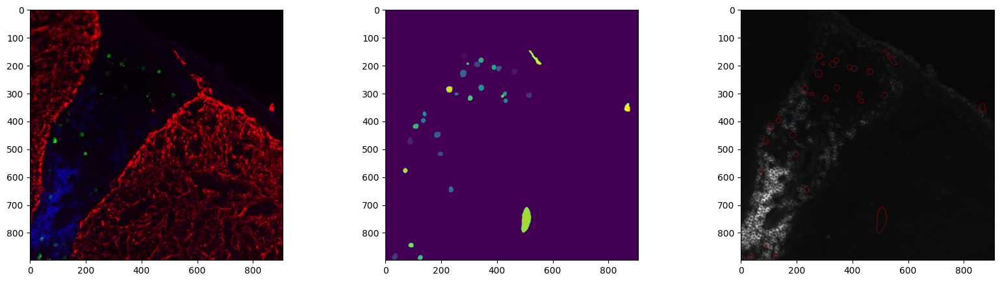

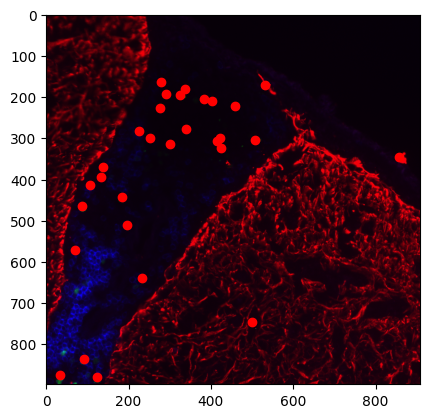

In [ ]:
###  FULL IMAGE ISSUES


s=img.shape[0]


#VISUALIZE

#Plot before and after
fig = plt.figure(figsize=(20, 5))
fig.add_subplot(1, 3, 1) #before
plt.imshow(img)
fig.add_subplot(1, 3, 2) #after
plt.imshow(mask)

#Plot superimposed
fig.add_subplot(1, 3, 3) #superimposed
pred_mask = mask
dilated_mask = binary_dilation(pred_mask)
edges = dilated_mask ^ pred_mask


full_img = np.array([img[:, :, -1]] * 3).transpose((1,2,0))
r, c = np.where(np.isclose(1.0, edges))
full_img[r, c] = [1,0,0]
plt.imshow(full_img)

bb = scale_bounding_boxes(bounding_boxes, s)
print ("Number of cells: ", bb.shape[0])
centroids = get_centroids(bb)
display_bounding_boxes(img, centroids = centroids)

Number of cells:  31


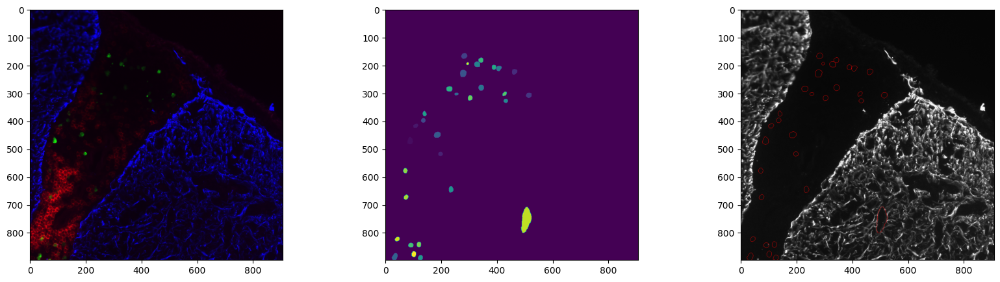

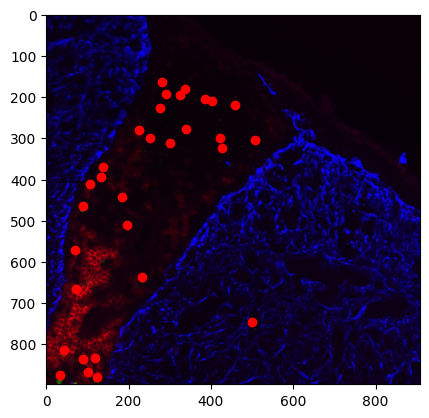

In [ ]:
# RGB - DIFFERENT CHANNELS = NON REPRODUCIBLE


#load file
file_name = "/content/drive/MyDrive/Summer/Images/Western1-9.tif"
raw_tiff_file = tf.imread(file_name)
s=img.shape[0]

#process image and run cellSAM
img = np.transpose(raw_tiff_file, (1, 2, 0))/4200 # H, W, C # REMOVE WHEN PUT TOGETHER
img = img[:,:,(3,2,1)]
mask, embedding, bounding_boxes = segment_cellular_image(img, device=str(device))


#VISUALIZE

#Plot before and after
fig = plt.figure(figsize=(20, 5))
fig.add_subplot(1, 3, 1) #before
plt.imshow(img)
fig.add_subplot(1, 3, 2) #after
plt.imshow(mask)

#Plot superimposed
fig.add_subplot(1, 3, 3) #superimposed
pred_mask = mask
dilated_mask = binary_dilation(pred_mask)
edges = dilated_mask ^ pred_mask


full_img = np.array([img[:, :, -1]] * 3).transpose((1,2,0))
r, c = np.where(np.isclose(1.0, edges))
full_img[r, c] = [1,0,0]
plt.imshow(full_img)

bb = scale_bounding_boxes(bounding_boxes, s)
print ("Number of cells: ", bb.shape[0])
centroids = get_centroids(bb)
display_bounding_boxes(img, centroids = centroids)

# One Tile

In [ ]:
tiles=[raw_tiff_file[700:700+s,150:150+s, 3] for s in range(190,290,10)]

2680


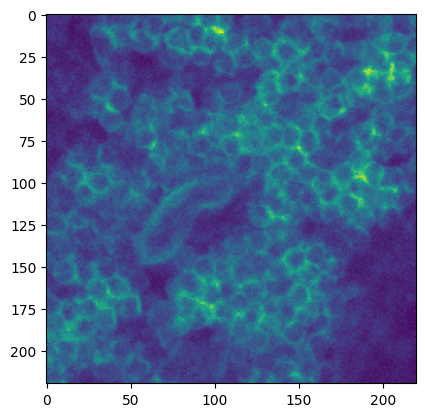

In [ ]:
s=220
plt.imshow(raw_tiff_file[700:700+s,150:150+s, 3])
testtile=raw_tiff_file[700:700+s,150:150+s, :]
print(max(testtile[:,:,3].flatten()))
testtile = testtile/4095

In [ ]:
#just 1 tile

cells_per_channel = []
i=3
channel=(i, i, i)
mask,e,bb = segment_cellular_image(testtile[:,:, channel], device=str(device))#run_cellsam(testtile, channel = (i,i,i)) #too slow... try all channels at once?

#(1=white, 2=yellow, 3=pink, 4=cyan)

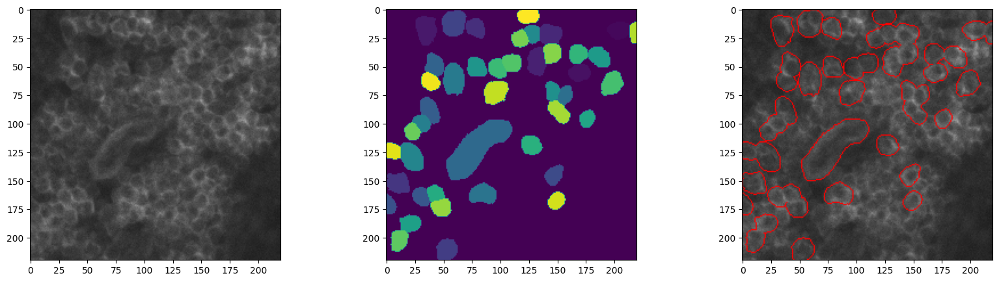

In [ ]:
# Output image of one particular tile (visualization)
img = testtile[:,:,(3,3,3)]

#Plot before and after
fig = plt.figure(figsize=(20, 5))
fig.add_subplot(1, 3, 1) #before
plt.imshow(img)
fig.add_subplot(1, 3, 2) #after
plt.imshow(mask)

#Plot superimposed
fig.add_subplot(1, 3, 3) #superimposed
pred_mask = mask
dilated_mask = binary_dilation(pred_mask)
edges = dilated_mask ^ pred_mask

full_img = np.array([img[:, :, -1]] * 3).transpose((1,2,0))
r, c = np.where(np.isclose(1.0, edges))
full_img[r, c] = [1,0,0]
plt.imshow(full_img)

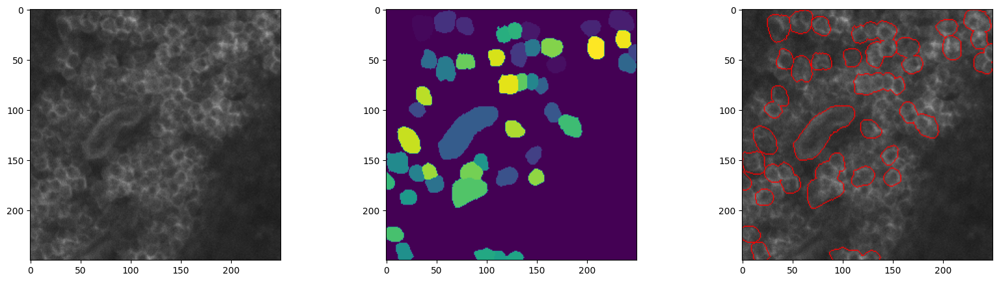

In [ ]:
# Output image of one particular tile (visualization)
img = testtile[:,:,(3,3,3)]

#Plot before and after
fig = plt.figure(figsize=(20, 5))
fig.add_subplot(1, 3, 1) #before
plt.imshow(img)
fig.add_subplot(1, 3, 2) #after
plt.imshow(mask)

#Plot superimposed
fig.add_subplot(1, 3, 3) #superimposed
pred_mask = mask
dilated_mask = binary_dilation(pred_mask)
edges = dilated_mask ^ pred_mask

full_img = np.array([img[:, :, -1]] * 3).transpose((1,2,0))
r, c = np.where(np.isclose(1.0, edges))
full_img[r, c] = [1,0,0]
plt.imshow(full_img)

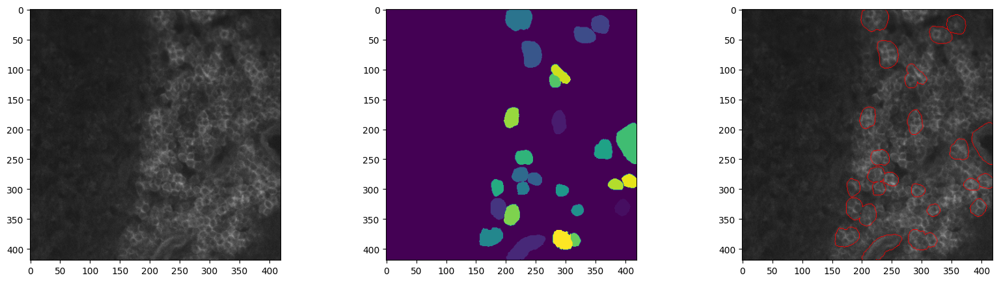

In [ ]:
# Output image of one particular tile (visualization)
i=2
img = tiles[i][:,:, (3, 3, 3)]

#Plot before and after
fig = plt.figure(figsize=(20, 5))
fig.add_subplot(1, 3, 1) #before
plt.imshow(img)
fig.add_subplot(1, 3, 2) #after
plt.imshow(results[i][0])

#Plot superimposed
fig.add_subplot(1, 3, 3) #superimposed
pred_mask = results[i][0]
dilated_mask = binary_dilation(pred_mask)
edges = dilated_mask ^ pred_mask

full_img = np.array([img[:, :, -1]] * 3).transpose((1,2,0))
r, c = np.where(np.isclose(1.0, edges))
full_img[r, c] = [1,0,0]
plt.imshow(full_img)

#Test with Guelph Imageset

In [ ]:
max( raw_tiff_file.flatten() )
raw_tiff_file.shape

(408, 409, 3)

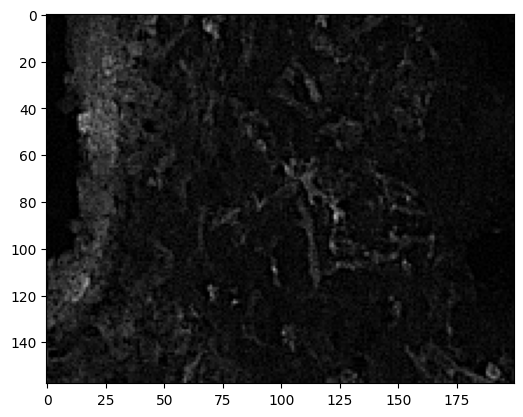

In [ ]:
plt.imshow(raw_tiff_file[250:250+crop_dimentions,150:150+crop_dimentions, (1,1,1)]/255) #purple, green, purple (duplicate) | 255 max

In [ ]:
crop_dimentions = 200

100%|██████████| 784M/784M [00:17<00:00, 44.4MiB/s]


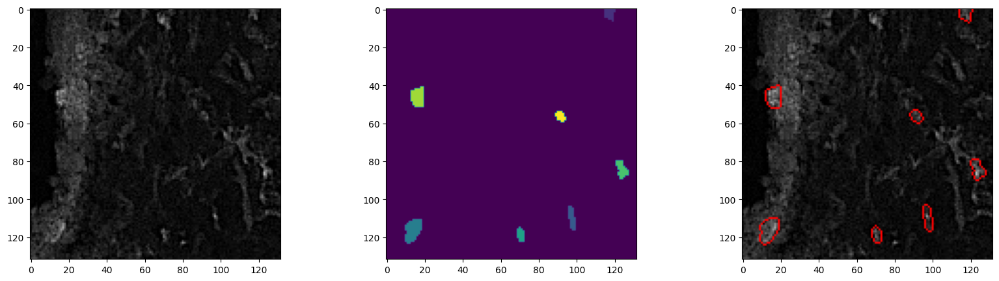

In [ ]:
### RBG one color channel scaled to 0-1, duplicated 3 times, and zoomed in

#load file
file_name = "/content/drive/MyDrive/Summer/Images/Guelph1-8.tif"
raw_tiff_file = tf.imread(file_name)

#process image and run cellSAM
#img = np.transpose(raw_tiff_file, (1, 2, 0)) # H, W, C
img = raw_tiff_file[250:250+crop_dimentions,150:150+crop_dimentions, (1,1,1)]/255 # H, W, C
mask, embedding, bounding_boxes = segment_cellular_image(img, device=str(device))

#Plot before and after
fig = plt.figure(figsize=(20, 5))
fig.add_subplot(1, 3, 1) #before
plt.imshow(img)
fig.add_subplot(1, 3, 2) #after
plt.imshow(mask)

#Plot superimposed
fig.add_subplot(1, 3, 3) #superimposed
pred_mask = mask
dilated_mask = binary_dilation(pred_mask)
edges = dilated_mask ^ pred_mask

full_img = np.array([img[:, :, -1]] * 3).transpose((1,2,0))
r, c = np.where(np.isclose(1.0, edges))
full_img[r, c] = [1,0,0]
plt.imshow(full_img)

#NOTE: some cells got merged together (eg. at 75, 175)

# Test with Western Dataset

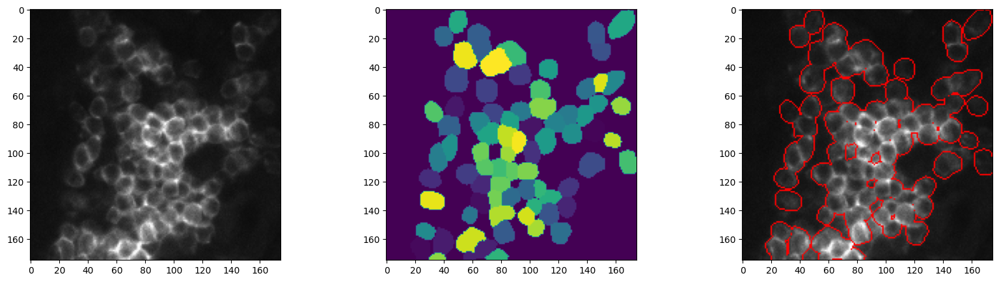

In [ ]:
### RBG one color channel scaled to 0-1, duplicated 3 times, and zoomed in

#load file
file_name = "/content/drive/MyDrive/Summer/Images/Western1-9.tif"
raw_tiff_file = tf.imread(file_name)

#process image and run cellSAM
img = np.transpose(raw_tiff_file, (1, 2, 0)) # H, W, C # REMOVE WHEN PUT TOGETHER
#img = img[500:700,0:200, (3, 3, 3)]/4200 # H, W, C
img = img[500:700-25,0+25:200, (3, 3, 3)]/4200 # H, W, C
mask, embedding, bounding_boxes = segment_cellular_image(img, device=str(device))

#Plot before and after
fig = plt.figure(figsize=(20, 5))
fig.add_subplot(1, 3, 1) #before
plt.imshow(img)
fig.add_subplot(1, 3, 2) #after
plt.imshow(mask)

#Plot superimposed
fig.add_subplot(1, 3, 3) #superimposed
pred_mask = mask
dilated_mask = binary_dilation(pred_mask)
edges = dilated_mask ^ pred_mask

full_img = np.array([img[:, :, -1]] * 3).transpose((1,2,0))
r, c = np.where(np.isclose(1.0, edges))
full_img[r, c] = [1,0,0]
plt.imshow(full_img)

#/root/.cache/torch/hub/checkpoints/ --> because cellSAM assests were corrupted/interrupted last time it was downloaded
#NOTE: some cells got merged together (eg. at 75, 175)

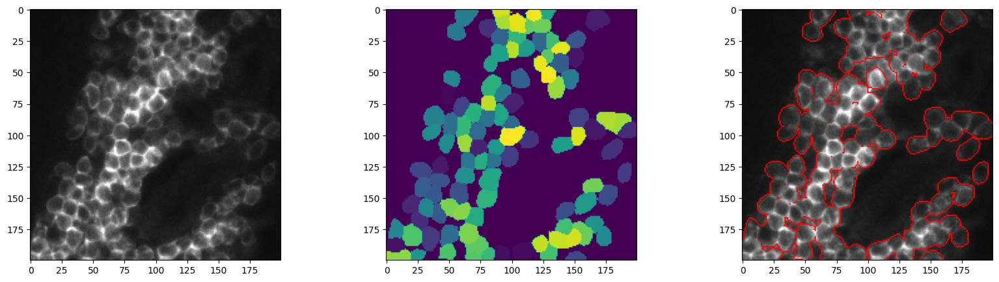

In [ ]:
# Output image of one particular tile (visualization)
i=12
img = tiles[i][:,:, (3, 3, 3)]

#Plot before and after
fig = plt.figure(figsize=(20, 5))
fig.add_subplot(1, 3, 1) #before
plt.imshow(img)
fig.add_subplot(1, 3, 2) #after
plt.imshow(results[i][0])

#Plot superimposed
fig.add_subplot(1, 3, 3) #superimposed
pred_mask = results[i][0]
dilated_mask = binary_dilation(pred_mask)
edges = dilated_mask ^ pred_mask

full_img = np.array([img[:, :, -1]] * 3).transpose((1,2,0))
r, c = np.where(np.isclose(1.0, edges))
full_img[r, c] = [1,0,0]
plt.imshow(full_img)

Number of cells:  77


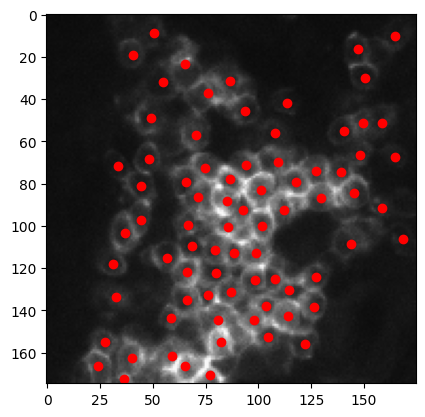

In [ ]:
bb = scale_bounding_boxes(bounding_boxes, 200-25)
print ("Number of cells: ", get_num_cells())
centroids = get_centroids(bb)
display_bounding_boxes(img, centroids = centroids)

In [ ]:
#Quantitizing functions

def get_num_cells():
  return bounding_boxes.shape[0]

def scale_bounding_boxes(bounding_boxes, img_size): #returns numpy array of the bounding boxes scaled to image size
  return bounding_boxes.cpu().detach().numpy()/1024*img_size #x1, y1, x2, y2

def display_bounding_boxes(img, bounding_boxes=None, centroids=None): #only accepts scaled bounding boxes
  #if not scaled.... bounding_boxes = bounding_boxes.cpu().detach().numpy()/1024*img_size #x1, y1, x2, y2
  fig, ax = plt.subplots()
  ax.imshow(img)
  if bounding_boxes is not None:
    for box in bounding_boxes: ax.add_patch(patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1], linewidth=1, edgecolor='g', facecolor='none')) #x1, y1, w, h
  if centroids is not None:
    for point in centroids: plt.scatter(point[0], point[1], c='red')
  plt.show()

def get_centroids(bounding_boxes):
  centroids = [] # NOTE: consider using a set for better searching efficiency?
  for box in bounding_boxes: #x1, y1, x2, y2
    centroids.append( ((box[0]+box[2])/2, (box[1]+box[3])/2) ) #NOTE: shoud be image height/width
  return centroids

#bb = scale_bounding_boxes(bounding_boxes, 200)
#print ("Number of cells: ", get_num_cells())
#centroids = get_centroids(bb)
#display_bounding_boxes(img, centroids = centroids)
#Current number of cells: 96
#Target number of cells: +

In [ ]:
#Now that I have the relative positions of the centroids, we just have to scale to the full image and calculate distance.
#Then, repeat and get count for each channel, and output the total in a nice summary table.

In [ ]:
#Then make it available as a website!

In [ ]:
#After that, we work on the transfer learning or LLM integration

# Other Tests

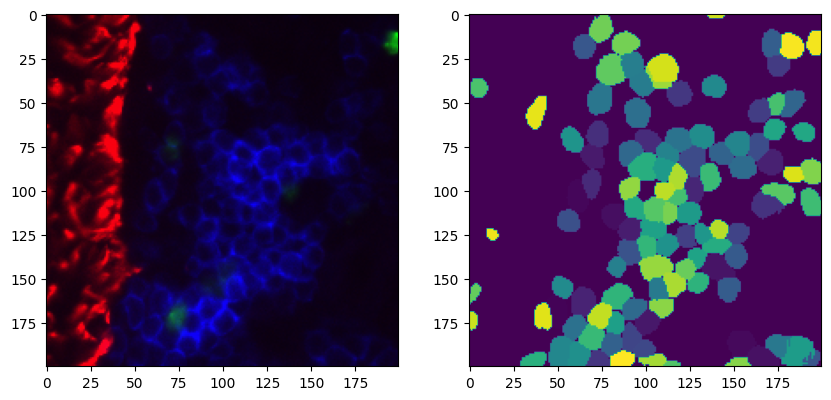

In [ ]:
### Multiple channels
img = np.transpose(raw_tiff_file, (1, 2, 0)) # H, W, C
img = img[500:700,0:200, (1, 2, 3)]/4200 # H, W, C
mask, embedding, bounding_boxes = segment_cellular_image(img, device=str(device))

#Plot before and after
fig = plt.figure(figsize=(10, 5))
fig.add_subplot(1, 2, 1) #before
plt.imshow(img)
fig.add_subplot(1, 2, 2) #after
plt.imshow(mask)

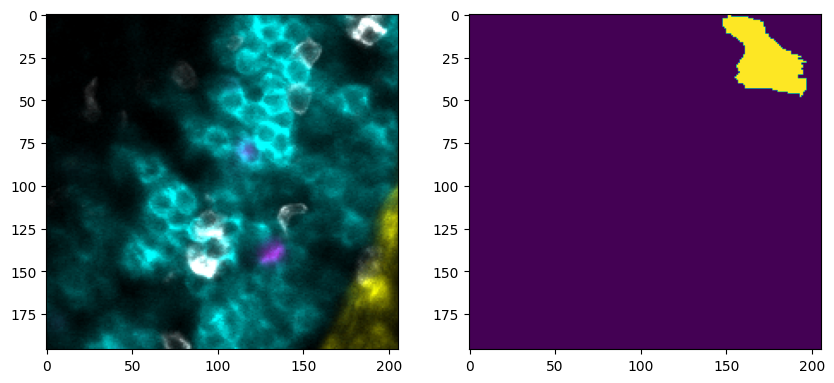

In [ ]:
### PNG PHOTO

from skimage import io
file_name = "/content/drive/MyDrive/Summer/Images/TestImage200x200.png"
raw_tiff_file = io.imread(file_name)

#Run cellSAM on image
img = raw_tiff_file
mask, embedding, bounding_boxes = segment_cellular_image(img, device=str(device))

#Plot before and after
fig = plt.figure(figsize=(10, 5))
fig.add_subplot(1, 2, 1) #before
plt.imshow(img)
fig.add_subplot(1, 2, 2) #after
plt.imshow(mask)

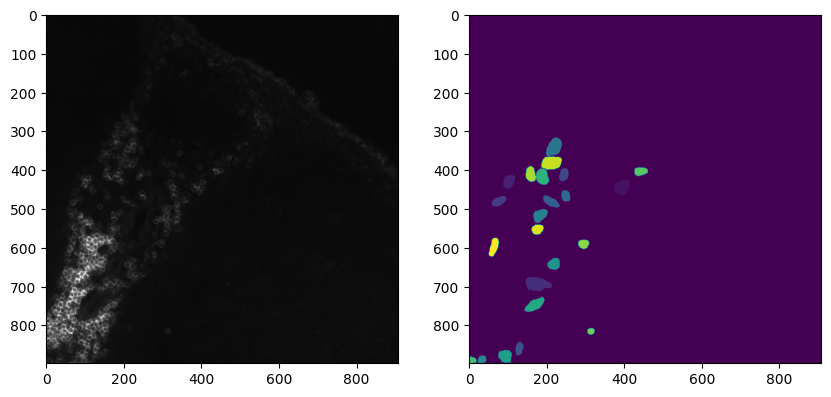

In [ ]:
### Triplicate same color channel
img = np.transpose(raw_tiff_file, (1, 2, 0)) # H, W, C
img = img[:,:, (3, 3, 3)]/4200 # H, W, C
mask, embedding, bounding_boxes = segment_cellular_image(img, device=str(device))

#Plot before and after
fig = plt.figure(figsize=(10, 5))
fig.add_subplot(1, 2, 1) #before
plt.imshow(img)
fig.add_subplot(1, 2, 2) #after
plt.imshow(mask)

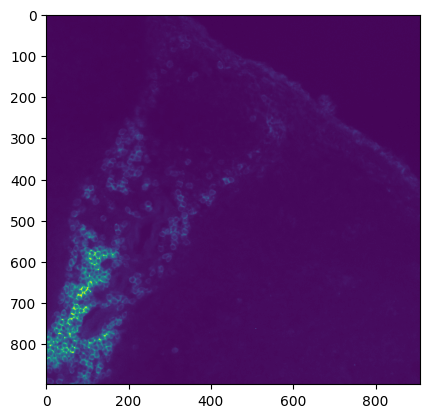

In [ ]:
### Triplicate same color channel
img = np.transpose(raw_tiff_file, (1, 2, 0)) # H, W, C
img = img[:,:,3] # H, W, C
plt.imshow(img)

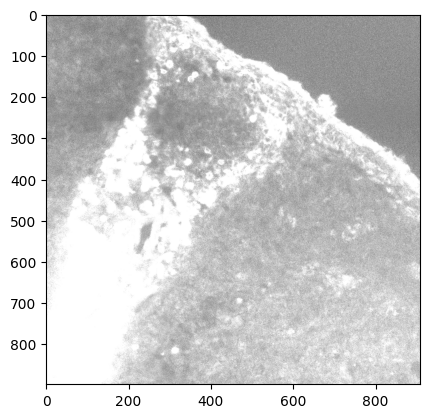

In [ ]:
img2 = np.repeat(img.reshape(898, 908, 1), 3, axis=2)
plt.imshow(img2)

In [ ]:
img2.shape

(898, 908, 3)

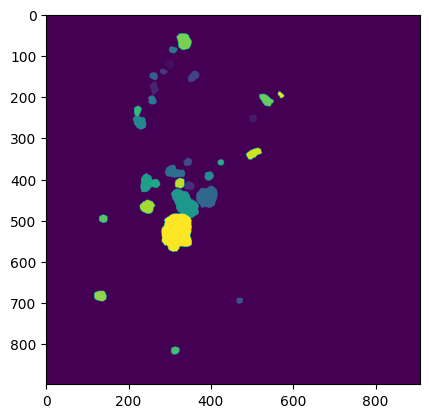

In [ ]:
#raw_tiff_file = np.load(file_name) #C, H, W
#img = np.transpose(raw_tiff_file, (1, 2, 0)) # H, W, C


mask, embedding, bounding_boxes = segment_cellular_image(img2, device=str(device))
plt.imshow(mask)

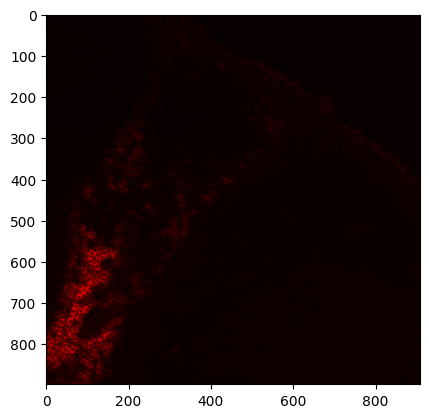

In [ ]:
### Pad other color channels
img = np.transpose(raw_tiff_file, (1, 2, 0)) # H, W, C
img3 = np.uint8(img[:,:,3]/4095*255) # H, W, C
#plt.imshow(img3)

#img3 = np.uint8(img/4095*255)
img3 = img3.reshape(img3.shape[0],img3.shape[1],1)
b = np.zeros(img3.shape)
g = np.zeros(img3.shape)

img3 = np.concatenate((img3, b, g), axis=2)
img3 = np.uint8(img3)
plt.imshow(img3)
#img3

/usr/local/lib/python3.10/dist-packages/cellSAM/model.py:126: UserWarning: No cells detected in the image.
  warn("No cells detected in the image.")


TypeError: Invalid shape (3, 898, 908) for image data

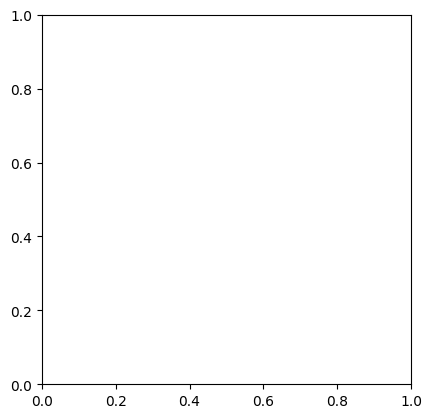

In [ ]:
mask, embedding, bounding_boxes = segment_cellular_image(img3, device=str(device))
plt.imshow(mask)